# 4. (Challenge) Time-dependent Schrödinger Equation for a Particle in a Potential Well

The time-dependent Schrödinger equation for a particle in a 2D potential $V(x, y)$ can be written as

\begin{equation}
i\hbar \frac{\partial \psi(x, y, t)}{\partial t}
= -\frac{\hbar^2}{2m}
\left(
\frac{\partial^2 \psi(x, y, t)}{\partial x^2}
+ 
\frac{\partial^2 \psi(x, y, t)}{\partial y^2}
\right)
+ V(x, y)\psi(x, y, t).
\end{equation}

where $\psi(x, y, t)$ is the wavefunction, and $V(x, y)$ is the potential. To facilitate our problem, consider a potential $V(x, y)$ given by a square with value zero inside the well and infinite outside. Thus, for a square of size $L$:

\begin{equation}
V(x, y) =
\begin{cases}
0, & \text{if } 0 \le x \le L \text{ and } 0 \le y \le L \\[4pt]
\infty & \text{otherwise}
\end{cases}
\end{equation}

As in the last exercise, we can start with a Gaussian wave packet located at the center of the well:

\begin{equation}
\psi(x, y, 0) = 
A \exp\!\left(
-\frac{(x - L/2)^2 + (y - L/2)^2}{2\sigma^2}
\right),
\end{equation}

where $A = \frac{1}{\sigma\sqrt{\pi}}$ guarantees normalization. Our task is to solve those equations for an electron (use $\hbar = 1.0545718 \times 10^{-34}\ \mathrm{J\cdot s}$, $m = 9.10938356 \times 10^{-31}\ \mathrm{kg}$).
- Let $L = 1\ \mathrm{nm}$. Choose an appropriate time discretization $\Delta t$ so that it satisfies  $\Delta t \le \frac{m(\Delta x)^2}{2\hbar}$, which guarantees numerical stability. Also set $\sigma = \frac{L}{10}$.

- By choosing appropriate time and space grids ($\Delta x$ and $\Delta t$), use the finite differences (FD) method to discretize the equation above.

- Solve the Schrödinger equation when subject to the potential $V(x, y)$. Don’t forget to guarantee that the complex function $\psi(x, y, t)$ is normalized at each time step.

- Observe how the wavefunction evolves over time. Calculate and plot the probability density $|\psi(x, y, t)|^2$ for some times and explore the dynamics.


# Discretizing TDSE

Discretizing the equation using the provided expressions, we get:

\begin{equation}
i\hbar \frac{u^{n+1}_{i,j} - u^n_{i,j}}{\Delta t}
= -\frac{\hbar^2}{2m}
\left(
\frac{u^n_{i+1,j} - 2u^n_{i,j} + u^n_{i-1,j}}{(\Delta x)^2}
+
\frac{u^n_{i,j+1} - 2u^n_{i,j} + u^n_{i,j-1}}{(\Delta y)^2}
\right)
+ V_{i,j}u^n_{i,j}
\end{equation}

Solving for $u^{n+1}_{i,j}(x, y)$:

\begin{equation}
u^{n+1}_{i,j}
= u^n_{i,j}
+ \frac{i\Delta t}{\hbar}
\left[
\frac{\hbar^2}{2m}
\left(
\frac{u^n_{i+1,j} - 2u^n_{i,j} + u^n_{i-1,j}}{(\Delta x)^2}
+
\frac{u^n_{i,j+1} - 2u^n_{i,j} + u^n_{i,j-1}}{(\Delta y)^2}
\right)
- V_{i,j}u^n_{i,j}
\right]
\end{equation}

We can simplify by defining $\gamma_1 = \frac{i \hbar \Delta t}{2m}$ and $\gamma_2 = \frac{i \Delta t}{\hbar}$:

\begin{equation}
\boxed{
u^{n+1}_{i,j}
= u^n_{i,j}
+ \gamma_1
\left[
\frac{u^n_{i+1,j} - 2u^n_{i,j} + u^n_{i-1,j}}{(\Delta x)^2}
+ \frac{u^n_{i,j+1} - 2u^n_{i,j} + u^n_{i,j-1}}{(\Delta y)^2}
\right]
- \gamma_2 V_{i,j} u^n_{i,j}
}
\end{equation}

The potential term can be ignored since $V(x,y) = 0$ within the well.

# CFL Condition 

The resolution parameters are sensitive and require some fine tuning &mdash; too high time resolution makes program slow, while too low challenges the numerical stability. By defining the parameters so that they are dependent on each other based of the CFL condition, we can reduce the number of parameters to adjust to just number of spatial points $n_x$ and time step safety factor $N_t$.

\begin{equation}
\Delta x = \frac{L}{n_x} \longrightarrow \Delta t_\text{max} = \frac{m\Delta x^2}{2\hbar} \longrightarrow \Delta t = \frac{\Delta t_\text{max}}{N_t}
\end{equation}

Where $\Delta t_\text{max}$ is the maximum time step allowed by the CFL Condition. 


In [5]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
import plotly.graph_objects as go

# Parameters
hbar = 1.0545718e-34  # Reduced Planck's constant (J·s)
m = 9.10938356e-31    # Electron mass (kg)
L = 1e-9               # Width of the potential well (m)
sigma = L / 10      # (m)
A = 1 / (sigma * np.sqrt(np.pi))  # Normalization constant
nx = 20    # Number of spatial points
N_t = 100     # Time step safety factor
dx = L/nx         # Spatial step (m)
max_dt = m * dx**2 / (2*hbar)       # Maximum time step for stability (s)
dt = max_dt / N_t   # Time step, a tenth of max for stability (s)
time_stop = 1e-16    # Total time (s)
nt = int(time_stop / dt)  # Number of time steps
psi_start = lambda x, y: A * np.exp(-((x - L/2)**2 + (y - L/2)**2) / (2 * sigma**2)) # Initial wavefunction for t = 0

gamma1 = 1j * dt * hbar / (2 * m)
gamma2 = -1j * dt / hbar # Can be ignored since V = 0 in the well

In [6]:
def probability_distribution(u, t):
    return np.abs(u[:, :, t])**2

def animate(x, y, u): 
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d') # define a single 3d subplot
    surf = [ax.plot_surface(x, y, probability_distribution(u, 0), cmap='viridis')] # initial surface plot
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('|ψ|²')
    
    time_skip = 10 # Number of time steps to skip for each frame (performance consideration)
    def update(frame):
        # Update the surface plot for each frame
        snapshot = frame * time_skip
        if (snapshot > nt): # avoid out of bounds error
            return ax
        surf[0].remove() # remove the old surface
        surf[0] = ax.plot_surface(x, y, probability_distribution(u, snapshot), cmap='viridis') # plot new surface
        time_elapsed = snapshot * dt
        ax.set_title(f't = {time_elapsed:.2e} s')
        return ax

    ani = animation.FuncAnimation(fig, update, frames=int(nt/time_skip), interval=50)
    plt.show()
    plt.close(fig)
    return HTML(ani.to_jshtml()) # Convert animation to HTML5 video, suitable for Jupyter Notebooks. Will be garbage collected before displaying if not returned.

def plot(x, y, u, title):
    surface_params = {
        "x": x,
        "y": y,
        "z": probability_distribution(u, 0).T,
        "colorscale": "viridis", 
    }

    go.Figure(data=go.Surface(surface_params)).update_layout(scene=dict(
                    xaxis_title="Position x",
                    yaxis_title="Position y",
                    zaxis_title="|ψ|²"),
                    title=title).show()

In [7]:
def setup():
    # Setup spatial grid and initial condition
    x = np.linspace(0, L, nx) # Spatial grid
    x, y = np.meshgrid(x, x) # convert to 2d spatial grid
    u = np.zeros((nx, nx, nt), dtype=complex) # 3d wavefunction array (x, y, t)
    
    u[:, :, 0] = psi_start(x, y) # Set initial condition 
    return x, y, u
x, y, u = setup() 
plot(x, y, u, "Initial Wavefunction")

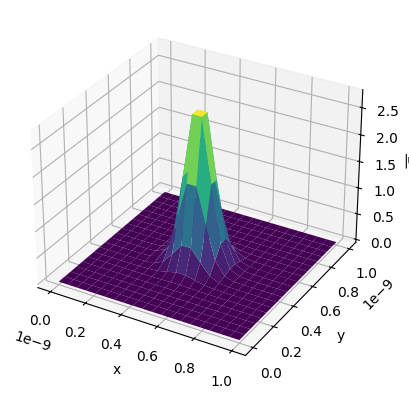

In [8]:
def second_order_discretization(u, i, j, k, dimension):
    # Second order discretizations from provided notes
    if dimension == 'x':
        return u[i+1, j, k] - 2*u[i, j, k] + u[i-1, j, k]
    if dimension == 'y':
        return u[i, j+1, k] - 2*u[i, j, k] + u[i, j-1, k]

def enforce_boundary_conditions(u, k):
    u[0,:,k] = 0
    u[-1,:,k] = 0
    u[:,0,k] = 0
    u[:,-1,k] = 0
    return u

def normalize(u, k):
    # Normalize the wavefunction at time step k by dividing by its norm
    norm = np.sqrt(np.sum(np.abs(u[:,:,k])**2)*dx**2) # From the Riemann sum approximation of the integral, i.e. sum over all spatial points times 2d postitional step size
    u[:,:,k] /= norm
    return u

x, y, u = setup()
for k in range(nt-1): #time steps
    for j in range(1, nx-1): 
        for i in range(1, nx-1): 
            #since neighbors are needed, skip positional boundaries 0 and nx-1
            u[i,j, k+1] = u[i,j,k] + gamma1 * (second_order_discretization(u,i,j,k,'x') + second_order_discretization(u,i,j,k,'y')) / dx**2 

    u = enforce_boundary_conditions(u, k+1)
    u = normalize(u, k+1)

animate(x, y, u)